# **Machine Learning (Random Forest)**

In [1]:
# Libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
import plotly.express as px
import plotly.graph_objects as go
from IPython.display import Image, display

# Data (cleaning and scaling)
df = pd.read_csv('AVONETplusClim.csv')
df_clean = df.copy()
df_clean = df_clean[(df_clean['Mass'] > 0) & (df_clean['Mass'] < 11500)]
df_clean = df_clean[(df_clean['Tail.Length'] > 0.1) & (df_clean['Tail.Length'] < 535)]
df_clean = df_clean[(df_clean['Tarsus.Length'] > 0) & (df_clean['Tarsus.Length'] < 350)]
df_clean = df_clean[(df_clean['Wing.Length'] > 0.1) & (df_clean['Wing.Length'] < 650)]
df_clean = df_clean[df_clean['Hand-Wing.Index'] > 3]
df_clean['Log_Mass'] = np.log10(df_clean['Mass'])
df_clean['Log_Tail'] = np.log10(df_clean['Tail.Length'])
df_clean['Log_Tarsus'] = np.log10(df_clean['Tarsus.Length'])
df_clean['Log_Beak'] = np.log10(df_clean['Beak.Length_Culmen'])
df_clean['Log_Wing'] = np.log10(df_clean['Wing.Length'])
df_clean['Log_HWI'] = np.log10(df_clean['Hand-Wing.Index'])

## **1. Body Size (Mass)**

A random forest regression is built to predict mass based on both ecological and climatic variables:
1. Categorical variables are converted into numerical variables using one-hot encoding.
2. The data is split into training (80%) and testing (20%) sets.
3. The model is trained with a given maximum depth, minimum leaf size, and forest size to prevent overfitting.
4. Feature importance of each predictor is calculated and plotted.
5. Distribution of mass based on the two most important predictors is plotted.


In [2]:
target = "Log_Mass"
eco_predictors = ['Trophic.Niche', 'Primary.Lifestyle', 'Habitat', 'Migration']
clim_predictors = ['Mean.Temperature', 'Temp.Seasonality', 'Max.Temperature', 'Min.Temperature', 'Mean.Precipitation']

X_eco = pd.get_dummies(df_clean[eco_predictors], drop_first=False)
X_clim = df_clean[clim_predictors]

X = pd.concat([X_eco, X_clim], axis=1)
y = df_clean[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestRegressor(
    n_estimators=100,
    max_depth=10,
    min_samples_leaf=5,
    random_state=42
)
rf.fit(X_train, y_train)
r2_val = r2_score(y_test, rf.predict(X_test))

importances = rf.feature_importances_
feature_names = X_train.columns

df_imp = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=True)

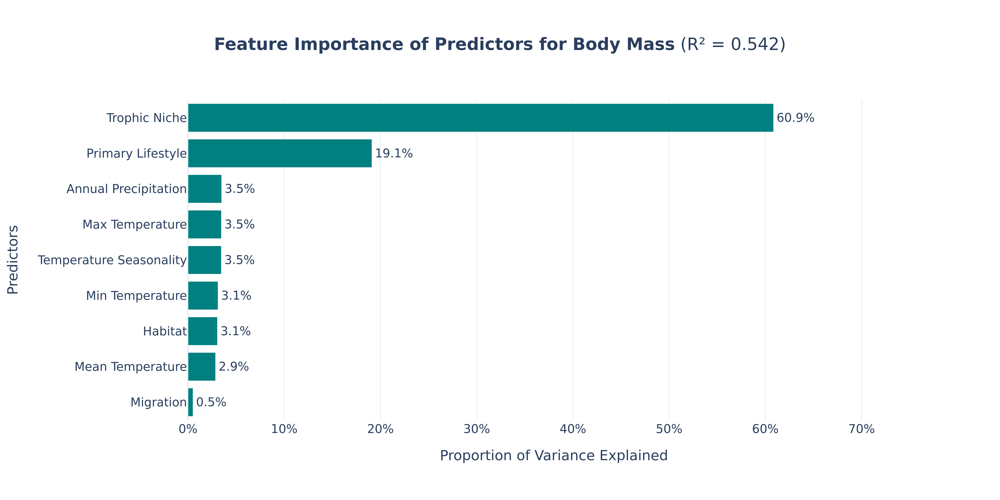

In [3]:
label_dict = {
    'Trophic.Niche': 'Trophic Niche', 'Primary.Lifestyle': 'Primary Lifestyle',
    'Habitat': 'Habitat', 'Migration': 'Migration', 'Trophic.Level': 'Trophic Level',
    'Mean.Temperature': 'Mean Temperature', 'Temp.Seasonality': 'Temperature Seasonality',
    'Max.Temperature': 'Max Temperature', 'Min.Temperature': 'Min Temperature',
    'Mean.Precipitation': 'Annual Precipitation'
}

def get_label(col):
    return label_dict.get(col, col.replace('.', ' ').replace('_', ' '))

grouped_scores = {col: 0.0 for col in eco_predictors + clim_predictors}
raw_importances = pd.Series(rf.feature_importances_, index=X_train.columns)

for feature, imp in raw_importances.items():
    found_group = False
    for group in eco_predictors:
        if feature.startswith(group):
            grouped_scores[group] += imp
            found_group = True
            break
    if not found_group and feature in clim_predictors:
        grouped_scores[feature] += imp

df_plot = pd.DataFrame([
    {'Label': get_label(k), 'Importance': v} 
    for k, v in grouped_scores.items() if v > 0
]).sort_values(by='Importance', ascending=True)

fig_imp = px.bar(
    df_plot,
    x='Importance',
    y='Label',
    orientation='h',
    title=f"<b>Feature Importance of Predictors for Body Mass</b> (R² = {r2_val:.3f})",
    text_auto='.1%'
)

fig_imp.update_traces(marker_color='teal', textposition='outside', cliponaxis=False)
fig_imp.update_layout(
    template="plotly_white",
    title_x=0.5,
    xaxis_title="Proportion of Variance Explained",
    yaxis_title="Predictors",
    width=1000,
    height=500,
    xaxis=dict(tickformat='.0%', range=[0, df_plot['Importance'].max() * 1.25])
)

fig_imp.write_image("Mass_Feature_Importance.png", scale=5)
display(Image("Mass_Feature_Importance.png"))

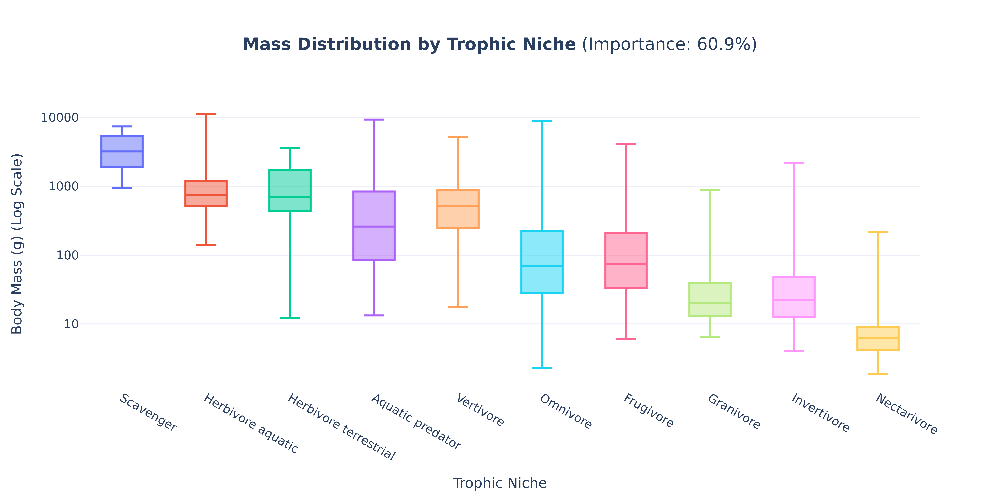

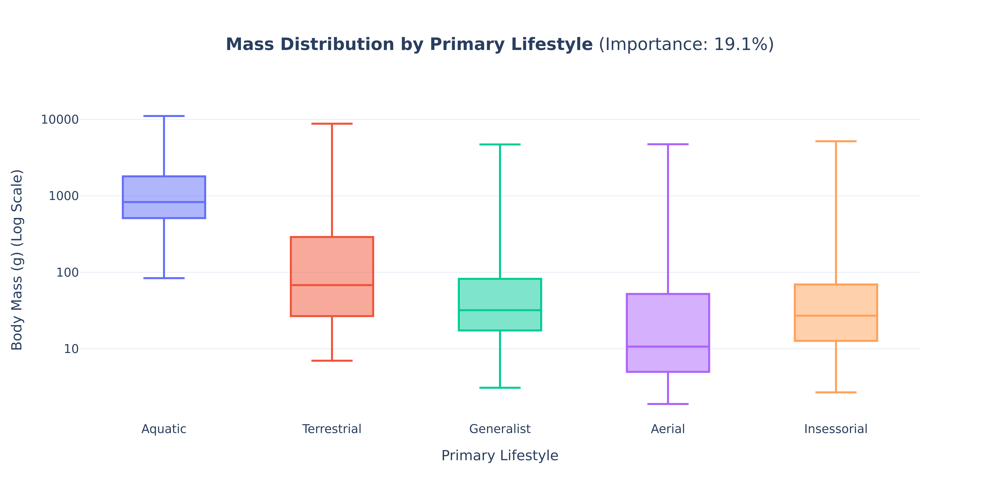

In [4]:
for col in ['Trophic.Niche', 'Primary.Lifestyle']:
    if col in df_clean.columns:
        order = df_clean.groupby(col)['Mass'].mean().sort_values(ascending=False).index
        clean_label = get_label(col)
        var_importance = df_plot.loc[df_plot['Label'] == clean_label, 'Importance']
        imp_text = f"(Importance: {var_importance.values[0]:.1%})" if not var_importance.empty else ""

        fig_eco = px.box(
            df_clean, 
            x=col, 
            y='Mass', 
            color=col,
            category_orders={col: order},
            log_y=True,
            title=f"<b>Mass Distribution by {clean_label}</b> {imp_text}",
            labels={col: clean_label, 'Mass': 'Body Mass (g) (Log Scale)'}, 
            points=False
        )
        
        fig_eco.update_layout(
            title_x=0.5,
            yaxis=dict(dtick=1, tickformat=".0f"),
            showlegend=False, 
            width=1000,
            height=500,
            template="plotly_white"
        )

        file_name = f"Mass_{col.replace('.', '_')}"
        fig_eco.write_image(f"{file_name}.png", scale=5)
        fig_eco.write_html(f"{file_name}.html", include_plotlyjs='cdn')
        display(Image(f"{file_name}.png"))

## **2. Leg Size (Tarsus Length)**

A random forest regression is built to predict tarsus length based on both ecological and climatic variables. Distribution of tarsus length based on the two most important predictors is plotted.

In [5]:
target = "Log_Tarsus"

X = pd.concat([X_eco, X_clim], axis=1)
y = df_clean[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestRegressor(
    n_estimators=100,
    max_depth=10,
    min_samples_leaf=5,
    random_state=42
)
rf.fit(X_train, y_train)
r2_val = r2_score(y_test, rf.predict(X_test))

importances = rf.feature_importances_
feature_names = X_train.columns

df_imp = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=True)

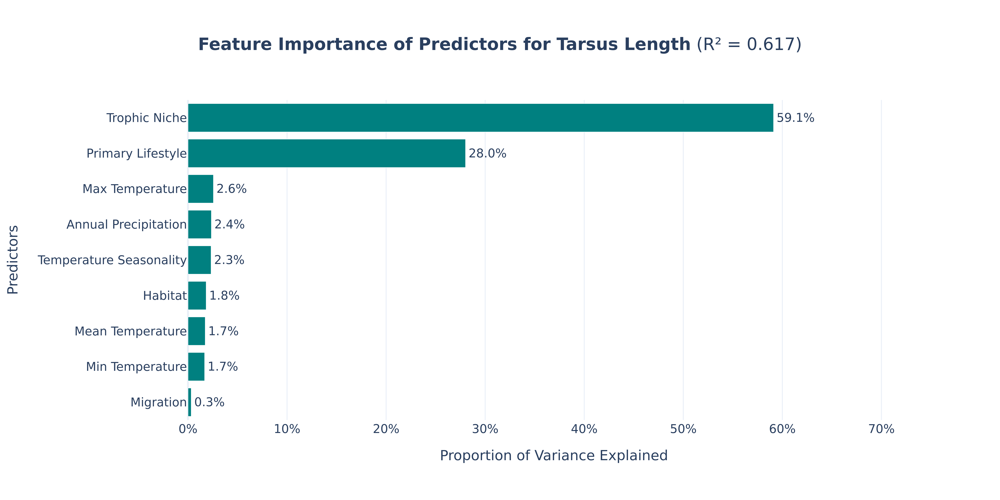

In [6]:
grouped_scores = {col: 0.0 for col in eco_predictors + clim_predictors}
raw_importances = pd.Series(rf.feature_importances_, index=X_train.columns)

for feature, imp in raw_importances.items():
    found_group = False
    for group in eco_predictors:
        if feature.startswith(group):
            grouped_scores[group] += imp
            found_group = True
            break
    if not found_group and feature in clim_predictors:
        grouped_scores[feature] += imp

df_plot = pd.DataFrame([
    {'Label': get_label(k), 'Importance': v} 
    for k, v in grouped_scores.items() if v > 0
]).sort_values(by='Importance', ascending=True)

fig_imp = px.bar(
    df_plot,
    x='Importance',
    y='Label',
    orientation='h',
    title=f"<b>Feature Importance of Predictors for Tarsus Length</b> (R² = {r2_val:.3f})",
    text_auto='.1%'
)

fig_imp.update_traces(marker_color='teal', textposition='outside', cliponaxis=False)
fig_imp.update_layout(
    template="plotly_white",
    title_x=0.5,
    xaxis_title="Proportion of Variance Explained",
    yaxis_title="Predictors",
    width=1000,
    height=500,
    xaxis=dict(tickformat='.0%', range=[0, df_plot['Importance'].max() * 1.25])
)

fig_imp.write_image("Tarsus_Feature_Importance.png", scale=5)
display(Image("Tarsus_Feature_Importance.png"))

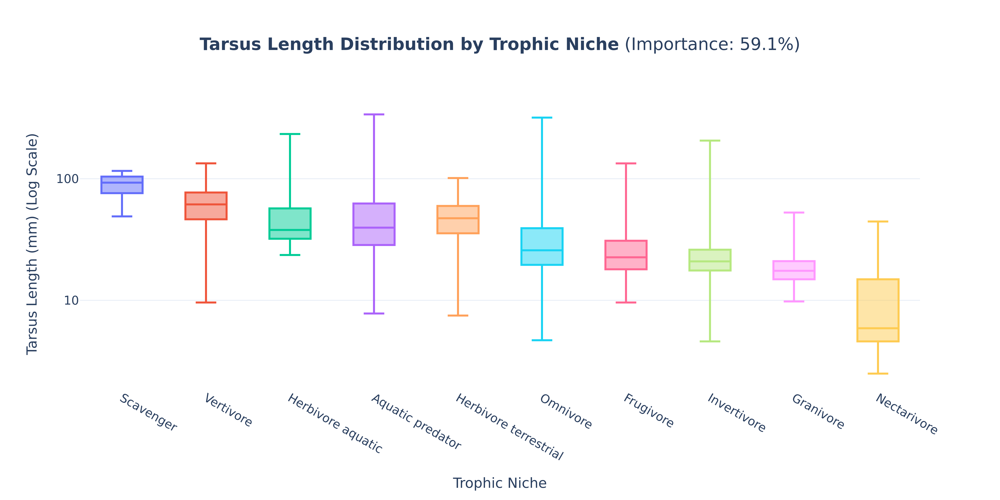

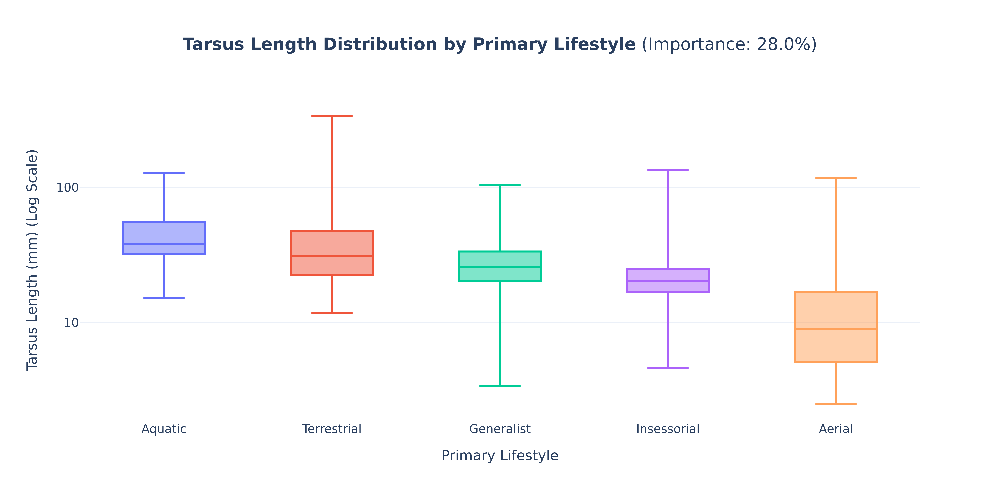

In [7]:
for col in ['Trophic.Niche', 'Primary.Lifestyle']:
    if col in df_clean.columns:
        order = df_clean.groupby(col)['Tarsus.Length'].mean().sort_values(ascending=False).index
        clean_label = get_label(col)
        var_importance = df_plot.loc[df_plot['Label'] == clean_label, 'Importance']
        imp_text = f"(Importance: {var_importance.values[0]:.1%})" if not var_importance.empty else ""

        fig_eco = px.box(
            df_clean, 
            x=col, 
            y='Tarsus.Length', 
            color=col,
            category_orders={col: order},
            log_y=True,
            title=f"<b>Tarsus Length Distribution by {clean_label}</b> {imp_text}",
            labels={col: clean_label, 'Tarsus.Length': 'Tarsus Length (mm) (Log Scale)'}, 
            points=False
        )
        
        fig_eco.update_layout(
            title_x=0.5,
            yaxis=dict(dtick=1, tickformat=".0f"),
            showlegend=False, 
            width=1000,
            height=500,
            template="plotly_white"
        )

        file_name = f"Tarsus_{col.replace('.', '_')}"
        fig_eco.write_image(f"{file_name}.png", scale=5)
        fig_eco.write_html(f"{file_name}.html", include_plotlyjs='cdn')
        display(Image(f"{file_name}.png"))

## **3. Tail Size (Tail Length)**

A random forest regression is built to predict tail length based on both ecological and climatic variables. Distribution of tail length based on the most important predictor is plotted.

In [8]:
target = "Log_Tail"

X = pd.concat([X_eco, X_clim], axis=1)
y = df_clean[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestRegressor(
    n_estimators=100,
    max_depth=10,
    min_samples_leaf=5,
    random_state=42
)
rf.fit(X_train, y_train)
r2_val = r2_score(y_test, rf.predict(X_test))

importances = rf.feature_importances_
feature_names = X_train.columns

df_imp = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=True)

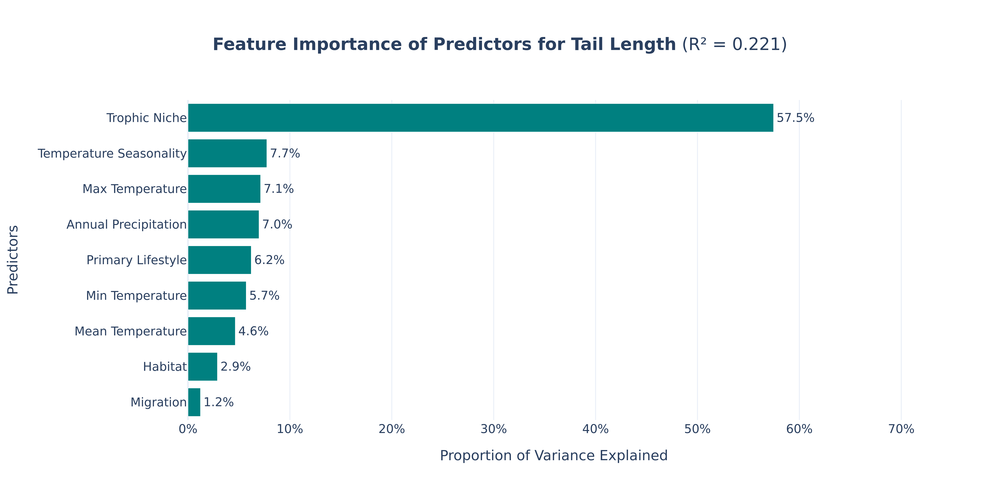

In [9]:
grouped_scores = {col: 0.0 for col in eco_predictors + clim_predictors}
raw_importances = pd.Series(rf.feature_importances_, index=X_train.columns)

for feature, imp in raw_importances.items():
    found_group = False
    for group in eco_predictors:
        if feature.startswith(group):
            grouped_scores[group] += imp
            found_group = True
            break
    if not found_group and feature in clim_predictors:
        grouped_scores[feature] += imp

df_plot = pd.DataFrame([
    {'Label': get_label(k), 'Importance': v} 
    for k, v in grouped_scores.items() if v > 0
]).sort_values(by='Importance', ascending=True)

fig_imp = px.bar(
    df_plot,
    x='Importance',
    y='Label',
    orientation='h',
    title=f"<b>Feature Importance of Predictors for Tail Length</b> (R² = {r2_val:.3f})",
    text_auto='.1%'
)

fig_imp.update_traces(marker_color='teal', textposition='outside', cliponaxis=False)
fig_imp.update_layout(
    template="plotly_white",
    title_x=0.5,
    xaxis_title="Proportion of Variance Explained",
    yaxis_title="Predictors",
    width=1000,
    height=500,
    xaxis=dict(tickformat='.0%', range=[0, df_plot['Importance'].max() * 1.25])
)

fig_imp.write_image("Tail_Feature_Importance.png", scale=5)
display(Image("Tail_Feature_Importance.png"))

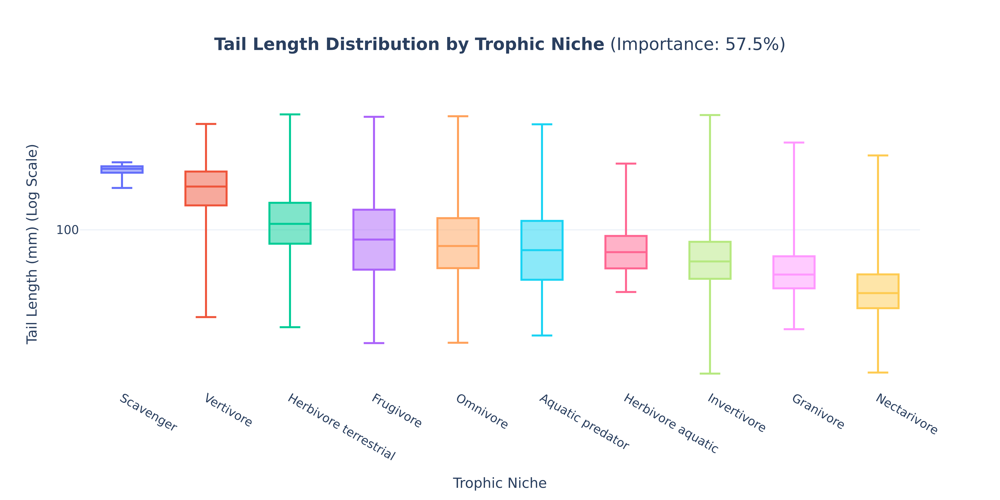

In [10]:
for col in ['Trophic.Niche']:
    if col in df_clean.columns:
        order = df_clean.groupby(col)['Tail.Length'].mean().sort_values(ascending=False).index
        clean_label = get_label(col)
        var_importance = df_plot.loc[df_plot['Label'] == clean_label, 'Importance']
        imp_text = f"(Importance: {var_importance.values[0]:.1%})" if not var_importance.empty else ""

        fig_eco = px.box(
            df_clean, 
            x=col, 
            y='Tail.Length', 
            color=col,
            category_orders={col: order},
            log_y=True,
            title=f"<b>Tail Length Distribution by {clean_label}</b> {imp_text}",
            labels={col: clean_label, 'Tail.Length': 'Tail Length (mm) (Log Scale)'}, 
            points=False
        )
        
        fig_eco.update_layout(
            title_x=0.5,
            yaxis=dict(dtick=1, tickformat=".0f"),
            showlegend=False, 
            width=1000,
            height=500,
            template="plotly_white"
        )

        file_name = f"Tail_{col.replace('.', '_')}"
        fig_eco.write_image(f"{file_name}.png", scale=5)
        fig_eco.write_html(f"{file_name}.html", include_plotlyjs='cdn')
        display(Image(f"{file_name}.png"))

## **4. Beak Size (Beak Length)**

A random forest regression is built to predict beak length based on both ecological and climatic variables. Distribution of beak length based on the most important predictor is plotted.

In [11]:
target = "Log_Beak"

X = pd.concat([X_eco, X_clim], axis=1)
y = df_clean[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestRegressor(
    n_estimators=100,
    max_depth=10,
    min_samples_leaf=5,
    random_state=42
)
rf.fit(X_train, y_train)
r2_val = r2_score(y_test, rf.predict(X_test))

importances = rf.feature_importances_
feature_names = X_train.columns

df_imp = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=True)

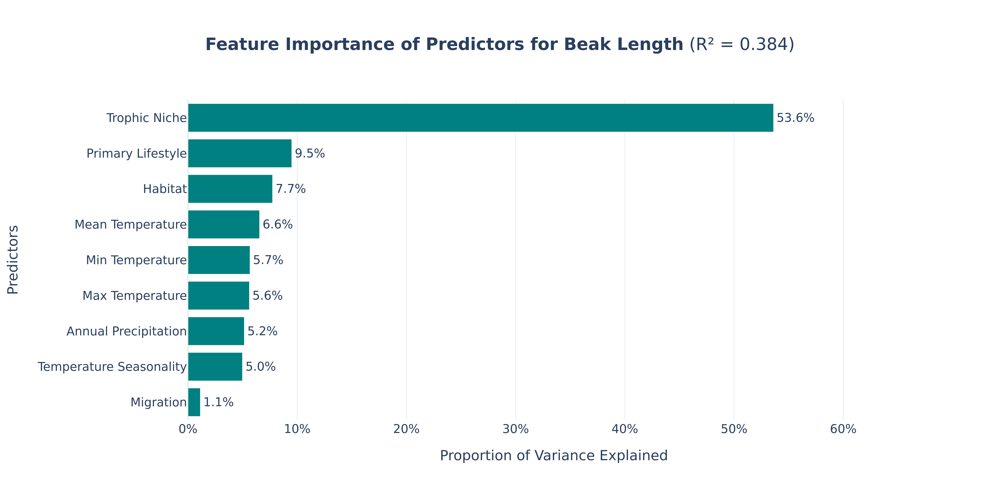

In [12]:
grouped_scores = {col: 0.0 for col in eco_predictors + clim_predictors}
raw_importances = pd.Series(rf.feature_importances_, index=X_train.columns)

for feature, imp in raw_importances.items():
    found_group = False
    for group in eco_predictors:
        if feature.startswith(group):
            grouped_scores[group] += imp
            found_group = True
            break
    if not found_group and feature in clim_predictors:
        grouped_scores[feature] += imp

df_plot = pd.DataFrame([
    {'Label': get_label(k), 'Importance': v} 
    for k, v in grouped_scores.items() if v > 0
]).sort_values(by='Importance', ascending=True)

fig_imp = px.bar(
    df_plot,
    x='Importance',
    y='Label',
    orientation='h',
    title=f"<b>Feature Importance of Predictors for Beak Length</b> (R² = {r2_val:.3f})",
    text_auto='.1%'
)

fig_imp.update_traces(marker_color='teal', textposition='outside', cliponaxis=False)
fig_imp.update_layout(
    template="plotly_white",
    title_x=0.5,
    xaxis_title="Proportion of Variance Explained",
    yaxis_title="Predictors",
    width=1000,
    height=500,
    xaxis=dict(tickformat='.0%', range=[0, df_plot['Importance'].max() * 1.25])
)

fig_imp.write_image("Beak_Feature_Importance.png", scale=5)
display(Image("Beak_Feature_Importance.png"))

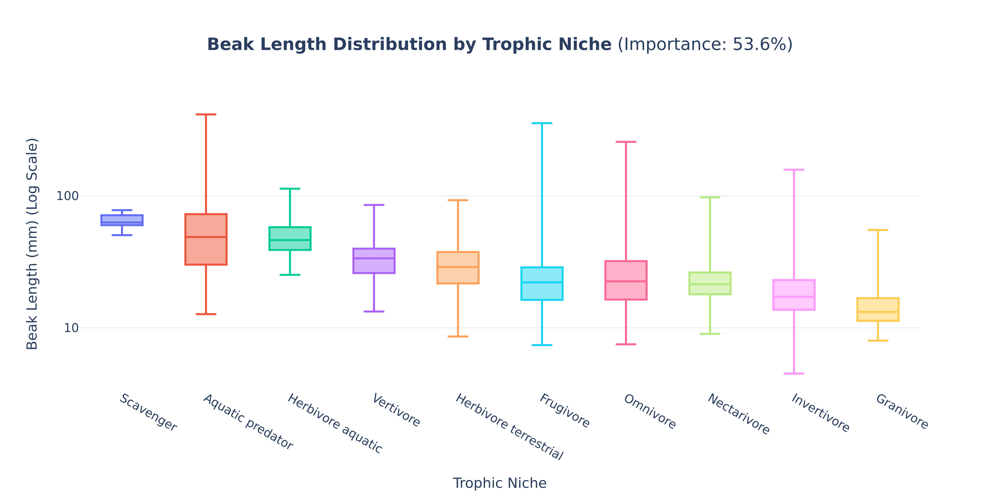

In [13]:
for col in ['Trophic.Niche']:
    if col in df_clean.columns:
        order = df_clean.groupby(col)['Beak.Length_Culmen'].mean().sort_values(ascending=False).index
        clean_label = get_label(col)
        var_importance = df_plot.loc[df_plot['Label'] == clean_label, 'Importance']
        imp_text = f"(Importance: {var_importance.values[0]:.1%})" if not var_importance.empty else ""

        fig_eco = px.box(
            df_clean, 
            x=col, 
            y='Beak.Length_Culmen', 
            color=col,
            category_orders={col: order},
            log_y=True,
            title=f"<b>Beak Length Distribution by {clean_label}</b> {imp_text}",
            labels={col: clean_label, 'Beak.Length_Culmen': 'Beak Length (mm) (Log Scale)'}, 
            points=False
        )
        
        fig_eco.update_layout(
            title_x=0.5,
            yaxis=dict(dtick=1, tickformat=".0f"),
            showlegend=False, 
            width=1000,
            height=500,
            template="plotly_white"
        )

        file_name = f"Beak_{col.replace('.', '_')}"
        fig_eco.write_image(f"{file_name}.png", scale=5)
        fig_eco.write_html(f"{file_name}.html", include_plotlyjs='cdn')
        display(Image(f"{file_name}.png"))

## **5. Wing Size and Shape (Wing Length and Hand-Wing Index)**

### **5.1. Wing Length**
A random forest regression is built to predict wing length based on both ecological and climatic variables. Distribution of wing length based on the two most important predictors is plotted.

In [14]:
target = "Log_Wing"

X = pd.concat([X_eco, X_clim], axis=1)
y = df_clean[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestRegressor(
    n_estimators=100,
    max_depth=10,
    min_samples_leaf=5,
    random_state=42
)
rf.fit(X_train, y_train)
r2_val = r2_score(y_test, rf.predict(X_test))

importances = rf.feature_importances_
feature_names = X_train.columns

df_imp = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=True)

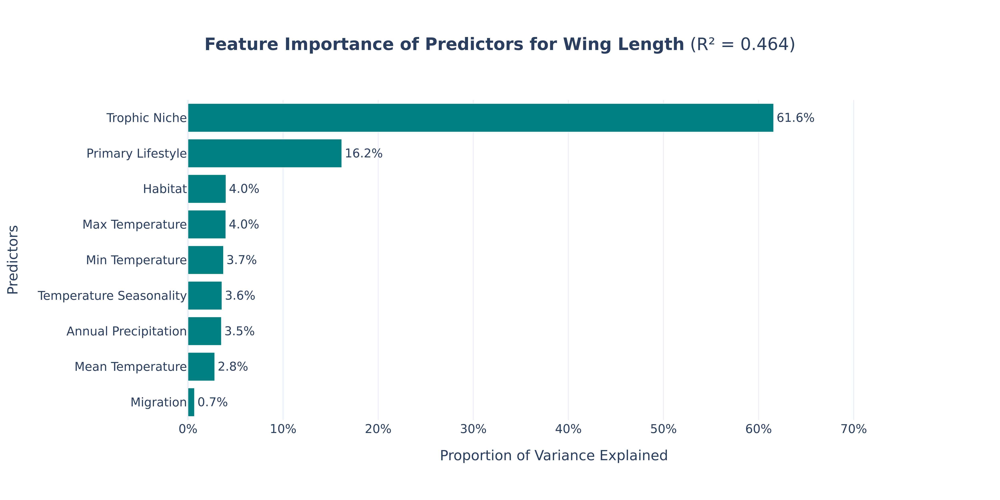

In [15]:
grouped_scores = {col: 0.0 for col in eco_predictors + clim_predictors}
raw_importances = pd.Series(rf.feature_importances_, index=X_train.columns)

for feature, imp in raw_importances.items():
    found_group = False
    for group in eco_predictors:
        if feature.startswith(group):
            grouped_scores[group] += imp
            found_group = True
            break
    if not found_group and feature in clim_predictors:
        grouped_scores[feature] += imp

df_plot = pd.DataFrame([
    {'Label': get_label(k), 'Importance': v} 
    for k, v in grouped_scores.items() if v > 0
]).sort_values(by='Importance', ascending=True)

fig_imp = px.bar(
    df_plot,
    x='Importance',
    y='Label',
    orientation='h',
    title=f"<b>Feature Importance of Predictors for Wing Length</b> (R² = {r2_val:.3f})",
    text_auto='.1%'
)

fig_imp.update_traces(marker_color='teal', textposition='outside', cliponaxis=False)
fig_imp.update_layout(
    template="plotly_white",
    title_x=0.5,
    xaxis_title="Proportion of Variance Explained",
    yaxis_title="Predictors",
    width=1000,
    height=500,
    xaxis=dict(tickformat='.0%', range=[0, df_plot['Importance'].max() * 1.25])
)

fig_imp.write_image("Wing_Feature_Importance.png", scale=5)
display(Image("Wing_Feature_Importance.png"))

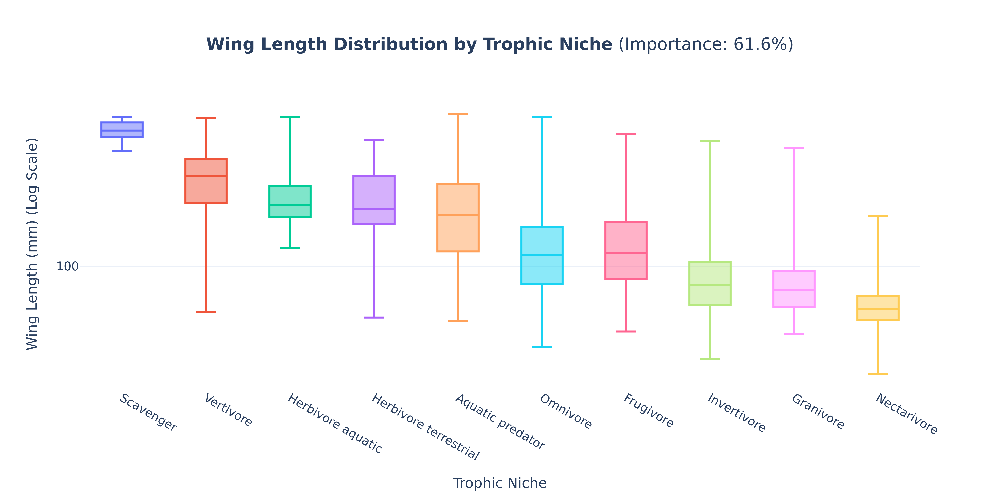

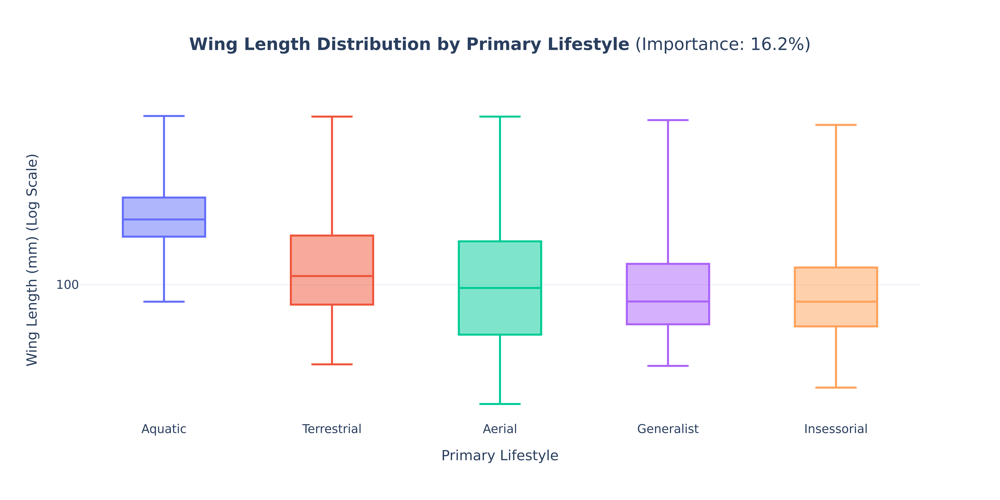

In [16]:
for col in ['Trophic.Niche', 'Primary.Lifestyle']:
    if col in df_clean.columns:
        order = df_clean.groupby(col)['Wing.Length'].mean().sort_values(ascending=False).index
        clean_label = get_label(col)
        var_importance = df_plot.loc[df_plot['Label'] == clean_label, 'Importance']
        imp_text = f"(Importance: {var_importance.values[0]:.1%})" if not var_importance.empty else ""

        fig_eco = px.box(
            df_clean, 
            x=col, 
            y='Wing.Length', 
            color=col,
            category_orders={col: order},
            log_y=True,
            title=f"<b>Wing Length Distribution by {clean_label}</b> {imp_text}",
            labels={col: clean_label, 'Wing.Length': 'Wing Length (mm) (Log Scale)'}, 
            points=False
        )
        
        fig_eco.update_layout(
            title_x=0.5,
            yaxis=dict(dtick=1, tickformat=".0f"),
            showlegend=False, 
            width=1000,
            height=500,
            template="plotly_white"
        )

        file_name = f"Wing_{col.replace('.', '_')}"
        fig_eco.write_image(f"{file_name}.png", scale=5)
        fig_eco.write_html(f"{file_name}.html", include_plotlyjs='cdn')
        display(Image(f"{file_name}.png"))

### **5.2. Hand-Wing Index (HWI)**
A random forest regression is built to predict HWI based on both ecological and climatic variables. Distribution of HWI based on the two most important predictors is plotted.

In [17]:
target = "Log_HWI"

X = pd.concat([X_eco, X_clim], axis=1)
y = df_clean[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf = RandomForestRegressor(
    n_estimators=100,
    max_depth=10,
    min_samples_leaf=5,
    random_state=42
)
rf.fit(X_train, y_train)
r2_val = r2_score(y_test, rf.predict(X_test))

importances = rf.feature_importances_
feature_names = X_train.columns

df_imp = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=True)

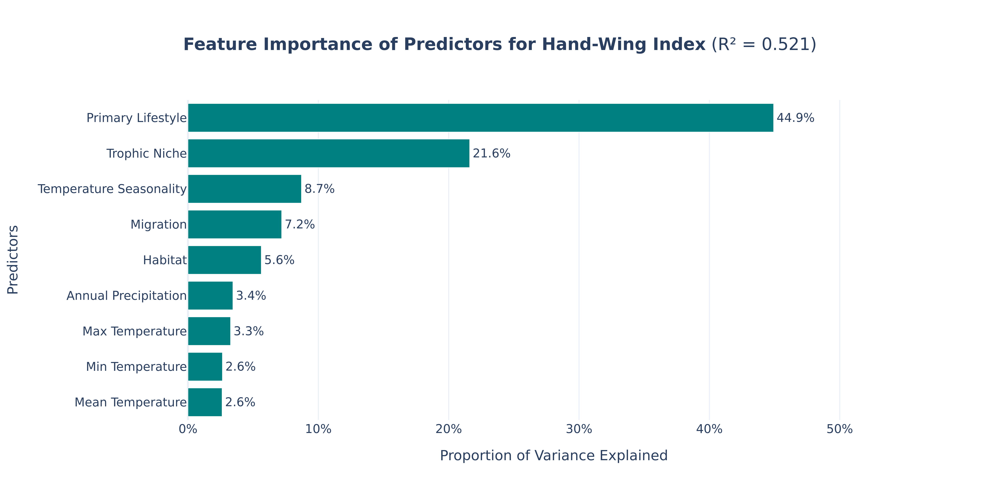

In [18]:
grouped_scores = {col: 0.0 for col in eco_predictors + clim_predictors}
raw_importances = pd.Series(rf.feature_importances_, index=X_train.columns)

for feature, imp in raw_importances.items():
    found_group = False
    for group in eco_predictors:
        if feature.startswith(group):
            grouped_scores[group] += imp
            found_group = True
            break
    if not found_group and feature in clim_predictors:
        grouped_scores[feature] += imp

df_plot = pd.DataFrame([
    {'Label': get_label(k), 'Importance': v} 
    for k, v in grouped_scores.items() if v > 0
]).sort_values(by='Importance', ascending=True)

fig_imp = px.bar(
    df_plot,
    x='Importance',
    y='Label',
    orientation='h',
    title=f"<b>Feature Importance of Predictors for Hand-Wing Index</b> (R² = {r2_val:.3f})",
    text_auto='.1%'
)

fig_imp.update_traces(marker_color='teal', textposition='outside', cliponaxis=False)
fig_imp.update_layout(
    template="plotly_white",
    title_x=0.5,
    xaxis_title="Proportion of Variance Explained",
    yaxis_title="Predictors",
    width=1000,
    height=500,
    xaxis=dict(tickformat='.0%', range=[0, df_plot['Importance'].max() * 1.25])
)

fig_imp.write_image("HWI_Feature_Importance.png", scale=5)
display(Image("HWI_Feature_Importance.png"))

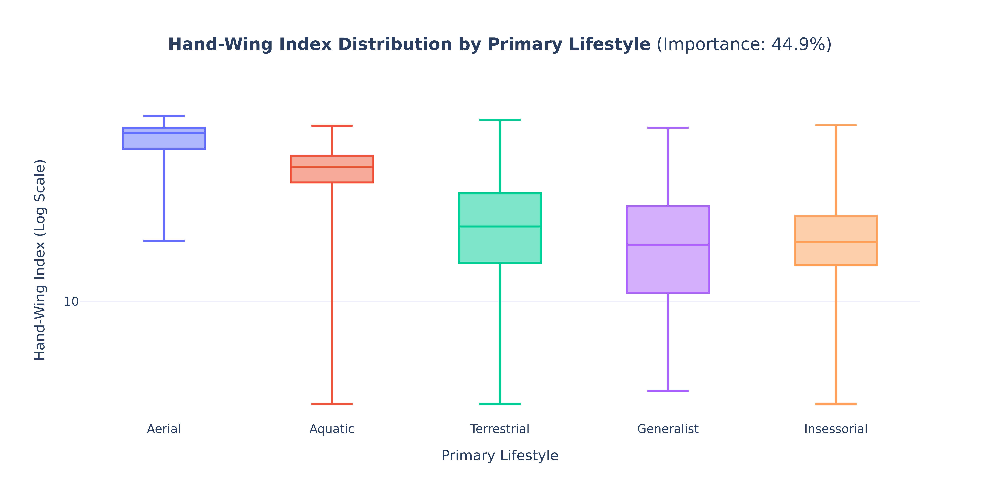

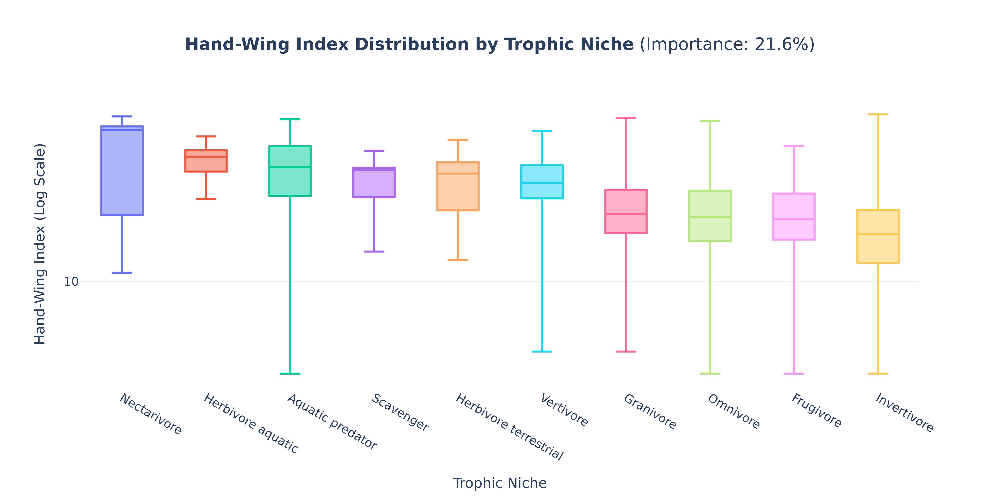

In [20]:
for col in [ 'Primary.Lifestyle', 'Trophic.Niche']:
    if col in df_clean.columns:
        order = df_clean.groupby(col)['Hand-Wing.Index'].mean().sort_values(ascending=False).index
        clean_label = get_label(col)
        var_importance = df_plot.loc[df_plot['Label'] == clean_label, 'Importance']
        imp_text = f"(Importance: {var_importance.values[0]:.1%})" if not var_importance.empty else ""

        fig_eco = px.box(
            df_clean, 
            x=col, 
            y='Hand-Wing.Index', 
            color=col,
            category_orders={col: order},
            log_y=True,
            title=f"<b>Hand-Wing Index Distribution by {clean_label}</b> {imp_text}",
            labels={col: clean_label, 'Hand-Wing.Index': 'Hand-Wing Index (Log Scale)'}, 
            points=False
        )
        
        fig_eco.update_layout(
            title_x=0.5,
            yaxis=dict(dtick=1, tickformat=".0f"),
            showlegend=False, 
            width=1000,
            height=500,
            template="plotly_white"
        )

        file_name = f"HWI_{col.replace('.', '_')}"
        fig_eco.write_image(f"{file_name}.png", scale=5)
        fig_eco.write_html(f"{file_name}.html", include_plotlyjs='cdn')
        display(Image(f"{file_name}.png"))